# Ok Cupid Dataset EDA

This dataset was picked on the name alone to do an initial clean and EDA.
The dataset is completly unfamiliar to me - I want to practice familiarising myself with the set and seeing what I can learn about it, to see what further investigation can stem from it. 

Currently, I am not altering any anomilies in the data (such as users with an age of 110), just noting them. This is because there is no question specified about the data and one may query things suchs as profile quality, and radical values would contribute to the understanding in that area. 

## Prepare for Data Analysis

### Load Packages

In [1]:
# initial imports and check file is readable
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt 
from PIL import Image # linked to generating a wordcloud
from os import path # for wordcloud
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator # for wordcloud

import re #regular expressions
import nltk
#nltk.download()
from nltk.tokenize import word_tokenize #turn strings into lists
from nltk.corpus import stopwords # remove words like 'a', 'an' etc.
stop_words = set(stopwords.words('english')) #imports the english stopwords
from nltk.stem import PorterStemmer #for 'stemming' words to improve search/assessments
stemmer = PorterStemmer()

okcupid = pd.read_csv('OkCupid_kaggle_dataset.zip')


In [2]:
# not sure what this is currently - took it from the wordcloud tutorial
#c:\intelpython3\lib\site-packages\matplotlib\__init__.py:
#import warnings
#warnings.filterwarnings("ignore")


### Load Data

In [45]:
pd.set_option('display.max_columns', None) # use this to display ALL columns and not get a ... midway
#print(okcupid.head((10)))

In [4]:
print("There are {} observations (i.e. personal profiles) and {} features in this dataset. \n".format(okcupid.shape[0],okcupid.shape[1]))

#print("There are {} types of wine in this dataset such as {}... \n".format(len(okcupid.variety.unique()),
#                                                                           ", ".join(okcupid.variety.unique()[0:5])))

#print("There are {} countries producing wine in this dataset such as {}... \n".format(len(df.country.unique()),
#                                                                                      ", ".join(df.country.unique()[0:5])))

There are 59946 observations (i.e. personal profiles) and 31 features in this dataset. 



In [5]:
#okcupid.shape

This set has 59946 rows and 31 columns

## Data Exploration

### Duplicates check

In [6]:
duplicates = okcupid.duplicated()
print(duplicates.value_counts())

False    59946
dtype: int64


The number of false duplicates equals the number of rows - i.e. there are no dupicated rows

## Tidying/Wrangling (?)

In [7]:
okcupid.shape

(59946, 31)

Quick check of the shape shows 59946 rows and 31 columns.

In [8]:
okcupid_variables = pd.DataFrame(okcupid.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 59946 entries, 0 to 59945
Data columns (total 31 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   age          59946 non-null  int64  
 1   status       59946 non-null  object 
 2   sex          59946 non-null  object 
 3   orientation  59946 non-null  object 
 4   body_type    54650 non-null  object 
 5   diet         35551 non-null  object 
 6   drinks       56961 non-null  object 
 7   drugs        45866 non-null  object 
 8   education    53318 non-null  object 
 9   ethnicity    54266 non-null  object 
 10  height       59943 non-null  float64
 11  income       59946 non-null  int64  
 12  job          51748 non-null  object 
 13  last_online  59946 non-null  object 
 14  location     59946 non-null  object 
 15  offspring    24385 non-null  object 
 16  pets         40025 non-null  object 
 17  religion     39720 non-null  object 
 18  sign         48890 non-null  object 
 19  smok

This dataset seems mostly/totally complete in the primary areas needed for a dating profile:

_Complete_
* Age
* Status (relationship status)
* Sex
* Orentation
* Last online (missing values here would be due to technical error - no online presence, no profile, no entry)
* Location
* Income

_Mostly complete (<5% missing values/ over 532000 values)_
* Body type
* Drinks (consumes alcohol)
* Education
* Ethnicity
* Height
* Smokes
* Speaks (languages)
* Essay 0 (first freeform question)

This gives a glimpse into which variables are possibly most valued, because either they were set as compulsory or people decided to complete them

In [9]:
print(okcupid.columns)

Index(['age', 'status', 'sex', 'orientation', 'body_type', 'diet', 'drinks',
       'drugs', 'education', 'ethnicity', 'height', 'income', 'job',
       'last_online', 'location', 'offspring', 'pets', 'religion', 'sign',
       'smokes', 'speaks', 'essay0', 'essay1', 'essay2', 'essay3', 'essay4',
       'essay5', 'essay6', 'essay7', 'essay8', 'essay9'],
      dtype='object')


Next I'll inspect each variable

0 'age' appears complete with Dtype int64 - ready to investiagte numerically
1 'status' - complete, object - check the unique types with .value_counts()
2 & 3 'sex' & 'orientation' - complete, object - check the unique types with .value_counts()

4 'body_type' - 54650 entries, therefore incomplete - check the unique types with .value_counts()
5 'diet' - 35551 - .value_counts()


In [10]:
okcupid.age.describe()

count    59946.000000
mean        32.340290
std          9.452779
min         18.000000
25%         26.000000
50%         30.000000
75%         37.000000
max        110.000000
Name: age, dtype: float64

'Age'

A complete variable, so next is to check the quality of the data. The min value is reasonable at 18, whereas the max value is an unlikely 110

In [11]:
okcupid.age.value_counts()

26     3724
27     3685
28     3583
25     3531
29     3295
24     3242
30     3149
31     2735
23     2592
32     2587
33     2206
22     1934
34     1902
35     1755
36     1583
37     1427
38     1330
21     1282
39     1172
42     1072
40     1030
41      980
20      953
43      858
44      708
45      643
19      611
46      578
47      529
48      481
49      459
50      437
51      350
52      344
18      309
56      271
54      267
55      265
57      256
53      252
59      221
58      197
60      195
61      176
62      167
63      138
64      113
65      109
66      105
67       66
68       59
69       31
110       1
109       1
Name: age, dtype: int64

--> a neater way to do this than value_counts()?
The data all looks reasonable apart from the ages of 110 and 109 - likely someone incorrectly entered their birthday or used a fake one

In [12]:
age_errors = okcupid[okcupid.age > 100]
print(age_errors)


       age     status sex orientation body_type          diet drinks  drugs  \
2512   110     single   f    straight       NaN           NaN    NaN    NaN   
25324  109  available   m    straight  athletic  mostly other    NaN  never   

                        education ethnicity  height  income      job  \
2512                          NaN       NaN    67.0      -1      NaN   
25324  working on masters program       NaN    95.0      -1  student   

            last_online                   location        offspring pets  \
2512   2012-06-27-22-16      daly city, california              NaN  NaN   
25324  2012-06-30-18-18  san francisco, california  might want kids  NaN   

                                  religion  \
2512                                   NaN   
25324  other and somewhat serious about it   

                                       sign         smokes          speaks  \
2512                                    NaN            NaN         english   
25324  aquarius but i

From viewing these, it seems where age=110 the profile may have been speculative and not wanting to give much information, as there is very little other information. 
Where age=109, there may have been an error as he is also uncommonly tall, 242 cm (shortest male entrant in list of Wikipedia world's tallest people is 216cm )

Will consider what to do with these results when the aim of the investigation is clearer

In [13]:
okcupid.status.value_counts()

single            55697
seeing someone     2064
available          1865
married             310
unknown              10
Name: status, dtype: int64

'Status'

is Relationship Status.
Categories are:
* Single
* Seeing somone
* Available
* Married
* Unknown - this one needs further investigation: unknown as in profile hasn't added their status? (from code snippet below I'd say yes)

In [14]:
okcupid.sex.value_counts()

m    35829
f    24117
Name: sex, dtype: int64

'Sex'

Only in two vales: 'm' or 'f'

In [15]:
okcupid.orientation.value_counts()

straight    51606
gay          5573
bisexual     2767
Name: orientation, dtype: int64

'Orientation'

is 'straight', 'gay' and 'bisexual'
Seen here large majority is straight, followed by gay then bisexual

In [16]:
okcupid.body_type.value_counts()

average           14652
fit               12711
athletic          11819
thin               4711
curvy              3924
a little extra     2629
skinny             1777
full figured       1009
overweight          444
jacked              421
used up             355
rather not say      198
Name: body_type, dtype: int64

In [17]:
#null_bodies = okcupid[okcupid.body_type.isnull()]
#print(null_bodies)

'Body_type' 

average           14652, 
fit               12711, 
athletic          11819, 
thin               4711, 
curvy              3924, 
a little extra     2629, 
skinny             1777, 
full figured       1009, 
overweight          444, 
jacked              421, 
used up             355, 
rather not say      198
From here I'll assume the NaN values are just unfilled cells


In [18]:
okcupid.diet.value_counts()

mostly anything        16585
anything                6183
strictly anything       5113
mostly vegetarian       3444
mostly other            1007
strictly vegetarian      875
vegetarian               667
strictly other           452
mostly vegan             338
other                    331
strictly vegan           228
vegan                    136
mostly kosher             86
mostly halal              48
strictly halal            18
strictly kosher           18
halal                     11
kosher                    11
Name: diet, dtype: int64

'Diet'

Variety of diet types, expaned by some having 'mostly...' and 'strictly...' categories

'Drinks'

In [19]:
okcupid.drinks.value_counts()

socially       41780
rarely          5957
often           5164
not at all      3267
very often       471
desperately      322
Name: drinks, dtype: int64

'Drugs'

In [20]:
okcupid.drugs.value_counts()

never        37724
sometimes     7732
often          410
Name: drugs, dtype: int64

In [21]:
okcupid.education.value_counts()

graduated from college/university    23959
graduated from masters program        8961
working on college/university         5712
working on masters program            1683
graduated from two-year college       1531
graduated from high school            1428
graduated from ph.d program           1272
graduated from law school             1122
working on two-year college           1074
dropped out of college/university      995
working on ph.d program                983
college/university                     801
graduated from space camp              657
dropped out of space camp              523
graduated from med school              446
working on space camp                  445
working on law school                  269
two-year college                       222
working on med school                  212
dropped out of two-year college        191
dropped out of masters program         140
masters program                        136
dropped out of ph.d program            127
dropped out

'Education'

33 different categories, ranging from 23959 to 11 entries

In [22]:
pd.set_option('display.max_rows', None)
okcupid.ethnicity.value_counts()


white                                                                                                      32831
asian                                                                                                       6134
hispanic / latin                                                                                            2823
black                                                                                                       2008
other                                                                                                       1706
hispanic / latin, white                                                                                     1301
indian                                                                                                      1077
asian, white                                                                                                 811
white, other                                                                                    

'Ethnicity'

217 different values - many mixes of ethnicities

_Here is may be worth separating the ethnicities, to be able to evaluate unique ethnicities, rathen than unique mixes_

In [23]:
okcupid.height.describe()

count    59943.000000
mean        68.295281
std          3.994803
min          1.000000
25%         66.000000
50%         68.000000
75%         71.000000
max         95.000000
Name: height, dtype: float64

In [24]:
okcupid.height.min()

1.0

'Height'

looks to have some erroneous entries as the min value is 1. 

Assuming unit to be inches

In [25]:
profile_heights = okcupid[okcupid.height < 50]
print(profile_heights.height)
print(len(profile_heights))

7098     36.0
7786     43.0
12193     8.0
12330    36.0
18583    36.0
18832     3.0
20010    36.0
20334    42.0
22963    36.0
23767     6.0
26191    47.0
27485    49.0
29934    48.0
30498    36.0
31158    36.0
36801    37.0
37111     9.0
44218    37.0
45570    36.0
45959     1.0
47583    43.0
47793    36.0
48280    26.0
49022    48.0
55600    36.0
56287     4.0
57606    36.0
Name: height, dtype: float64
27


In [26]:
#import seaborn as sns
#import matplotlib.pyplot as plt

In [27]:
#sns.histplot(x='height', data=profile_heights)
#plt.show()

There are 4 entries under 10 inches. Investigate what to do with these results. Look at the rest of their entries

In [28]:
profile_heights = okcupid[okcupid.height < 10]
print(profile_heights)

       age  status sex orientation body_type               diet       drinks  \
12193   30  single   f    straight       NaN  mostly vegetarian     socially   
18832   39  single   m    straight  athletic                NaN     socially   
23767   32  single   f    straight      thin    mostly anything  desperately   
37111   25  single   m    straight       fit    mostly anything     socially   
45959   36  single   m    straight       NaN                NaN   very often   
56287   25  single   f    straight       NaN                NaN        often   

       drugs                          education  \
12193    NaN          graduated from space camp   
18832  never     graduated from masters program   
23767    NaN            working on ph.d program   
37111  never  graduated from college/university   
45959  never  graduated from college/university   
56287  often              working on space camp   

                                ethnicity  height   income  \
12193              

_look at max value heights, as found from looking at age_ 

Other that several having no income (not significant when considered with below) the rest of the entries are not suspiscious

'Income'

 looks to be broken down into income brackets with -1 being the entry for no income given (and also having the highest count)

In [29]:
okcupid.income.value_counts()

-1          48442
 20000       2952
 100000      1621
 80000       1111
 30000       1048
 40000       1005
 50000        975
 60000        736
 70000        707
 150000       631
 1000000      521
 250000       149
 500000        48
Name: income, dtype: int64

In [30]:
okcupid.job.value_counts()
print('num of entries: ')
print(okcupid.job.value_counts().sum())

null_jobs = okcupid[okcupid.job.isnull()]
print(null_jobs)


num of entries: 
51748
       age          status sex orientation       body_type  \
2       38       available   m    straight            thin   
6       32          single   f    straight             fit   
8       24          single   f    straight             NaN   
10      35       available   m    straight         average   
28      30          single   m    straight             fit   
41      35          single   m    straight        athletic   
46      27          single   m    straight        athletic   
51      38          single   f         gay        athletic   
59      31          single   m    straight         average   
76      26          single   m    straight             fit   
81      31          single   m         gay         average   
85      28          single   m    straight         average   
86      40          single   f    straight             fit   
89      37          single   f    straight         average   
112     24          single   m    straight     

'Job'

Some contain multiple roles in format role / role / role

In [31]:
#df[["country", "description","points"]].head()
#okcupid[okcupid.columns[:-8]].head()

In [32]:
okcupid.last_online.info()
okcupid.last_online.head()

<class 'pandas.core.series.Series'>
RangeIndex: 59946 entries, 0 to 59945
Series name: last_online
Non-Null Count  Dtype 
--------------  ----- 
59946 non-null  object
dtypes: object(1)
memory usage: 468.5+ KB


0    2012-06-28-20-30
1    2012-06-29-21-41
2    2012-06-27-09-10
3    2012-06-28-14-22
4    2012-06-27-21-26
Name: last_online, dtype: object

'last_online' 

has no null values and is of the format year-month-day-hour-minute so may need to be split later if this is to be analysed
Basic analysis to provide would be:
* range of dates: so how wide and recent is the set?
This is a _last_ online value - so what can it be used for? App usage over the range of dates - have people from earlier in the period stopped using it? Unsure, needs more consideration

In [33]:
okcupid.location.value_counts()
okcupid.location.info()

<class 'pandas.core.series.Series'>
RangeIndex: 59946 entries, 0 to 59945
Series name: location
Non-Null Count  Dtype 
--------------  ----- 
59946 non-null  object
dtypes: object(1)
memory usage: 468.5+ KB


'location'

seems to have no null values. Appears to contain cities, state (if in USA) city, country (if outside USA)

In [34]:
okcupid.offspring.value_counts() 
okcupid.offspring.info()
okcupid.offspring.isnull

<class 'pandas.core.series.Series'>
RangeIndex: 59946 entries, 0 to 59945
Series name: offspring
Non-Null Count  Dtype 
--------------  ----- 
24385 non-null  object
dtypes: object(1)
memory usage: 468.5+ KB


<bound method Series.isnull of 0         doesn't have kids, but might want them
1         doesn't have kids, but might want them
2                                            NaN
3                              doesn't want kids
4                                            NaN
5         doesn't have kids, but might want them
6                                            NaN
7              doesn't have kids, but wants them
8                              doesn't have kids
9                                            NaN
10                                           NaN
11                                           NaN
12                             doesn't have kids
13                                           NaN
14             doesn't have kids, but wants them
15                             doesn't have kids
16                                           NaN
17                             doesn't have kids
18                                           NaN
19                             doesn't

'offspring' 

has a large number of null values as NaN. Currently type is object.

In [35]:
okcupid.pets.value_counts()
#okcupid.pets.info()
#okcupid.pets.isnull()

likes dogs and likes cats          14814
likes dogs                          7224
likes dogs and has cats             4313
has dogs                            4134
has dogs and likes cats             2333
likes dogs and dislikes cats        2029
has dogs and has cats               1474
has cats                            1406
likes cats                          1063
has dogs and dislikes cats           552
dislikes dogs and likes cats         240
dislikes dogs and dislikes cats      196
dislikes cats                        122
dislikes dogs and has cats            81
dislikes dogs                         44
Name: pets, dtype: int64

'pets' 

answers are based entirely on cats and dogs. Many NaN values in set

In [36]:
okcupid.religion.value_counts() 
#okcupid.religion.info()
#okcupid.religion.isnull

agnosticism                                   2724
other                                         2691
agnosticism but not too serious about it      2636
agnosticism and laughing about it             2496
catholicism but not too serious about it      2318
atheism                                       2175
other and laughing about it                   2119
atheism and laughing about it                 2074
christianity                                  1957
christianity but not too serious about it     1952
other but not too serious about it            1554
judaism but not too serious about it          1517
atheism but not too serious about it          1318
catholicism                                   1064
christianity and somewhat serious about it     927
atheism and somewhat serious about it          848
other and somewhat serious about it            846
catholicism and laughing about it              726
judaism and laughing about it                  681
buddhism but not too serious ab

'Religion'

has a large number of values, with a large ammount of NaN values 

In [37]:
okcupid.sign.value_counts() 
okcupid.sign.info()


<class 'pandas.core.series.Series'>
RangeIndex: 59946 entries, 0 to 59945
Series name: sign
Non-Null Count  Dtype 
--------------  ----- 
48890 non-null  object
dtypes: object(1)
memory usage: 468.5+ KB


'sign' 

has a large number of values. profiles list their star sign and also if it matters to them and how much. Splitting into 'Star sign' and 'value placed on star sign' seems more valuable for analysis

In [38]:
okcupid.smokes.value_counts()
okcupid.smokes.info()

<class 'pandas.core.series.Series'>
RangeIndex: 59946 entries, 0 to 59945
Series name: smokes
Non-Null Count  Dtype 
--------------  ----- 
54434 non-null  object
dtypes: object(1)
memory usage: 468.5+ KB


'smokes'

small range of values, some null

In [39]:
okcupid.speaks.value_counts()

english                                                                                                        21828
english (fluently)                                                                                              6628
english (fluently), spanish (poorly)                                                                            2059
english (fluently), spanish (okay)                                                                              1917
english (fluently), spanish (fluently)                                                                          1288
english, spanish                                                                                                 859
english (fluently), french (poorly)                                                                              756
english, spanish (okay)                                                                                          655
english, spanish (poorly)                                       

'speaks' 

languages: lists of languages and proficiency. Count looks to be who speaks which combination of language and proficiency, not a count of number of speakers per language. May be useful but nieche. Better to split into languages spoken and count as individual items

## Visualisations of non-freeform answers

This is a placeholder to do some visualisations of the variables above to help give an overview of the dataset

# Statistics

Placeholder to consider statistics from the set

# The essays
Each profile has 'essays' - free form answer questions.
This section looks to be suited to a language focused analysis, enabling answering questions such as:
* which words are most frequently used
* which topics most frenquently arise

Explore sorting and filtering words and create a word cloud for to display frequencies

In [40]:
essay0 = okcupid.essay0.dropna()
print(len(essay0))

54458


In [41]:
print(essay0.dtype)

object


In [42]:
essay0 = essay0.astype('string')  # this is the only way I could find to convert to string

print(essay0.dtype)
print(essay0.isnull().value_counts())
#okcupid.age.dtype

string
False    54458
Name: essay0, dtype: int64


Here a sticking point was having not installed nltk - it was installed on pip but I needed to run:
import nltk
nltk.download()
then save all the packages in C:\nltk_data
Note: that code only needs to be run the once to install, then delete/comment out

In [43]:
essay_master = essay0
#print(essay_master[0].title())
essay_master = re.sub(r'[\.\?\!\,\:\;\(\)\"]', '', essay_master[0])
print(essay_master)
# essay_split = essay_master.title().split() ## this way splits at the spaces but doesnt clean anything 
# print(len(essay_split))
#essay_split = pd.DataFrame(essay_split)
#essay_split.shape
#essay_split.value_counts()
# print(essay_split)
#textt = 'today is very warms and sunny'
#tokens = word_tokenize(textt)
essay_tokens = word_tokenize(essay_master) # tokenize/ turn string into a list of words
print(essay_tokens)

essay_no_stops = [word for word in essay_tokens if word not in stop_words] # uses list comprehension to remove stopwords
print(essay_no_stops)


about me  i would love to think that i was some some kind of intellectual either the dumbest smart guy or the smartest dumb guy can't say i can tell the difference i love to talk about ideas and concepts i forge odd metaphors instead of reciting cliches like the simularities between a friend of mine's house and an underwater salt mine my favorite word is salt by the way weird choice i know to me most things in life are better as metaphors i seek to make myself a little better everyday in some productively lazy way got tired of tying my shoes considered hiring a five year old but would probably have to tie both of our shoes decided to only wear leather shoes dress shoes  about you  you love to have really serious really deep conversations about really silly stuff you have to be willing to snap me out of a light hearted rant with a kiss you don't have to be funny but you have to be able to make me laugh you should be able to bend spoons with your mind and telepathically make me smile whi

In [48]:
#?WordCloud 

# this is the docstring showing the options of the function

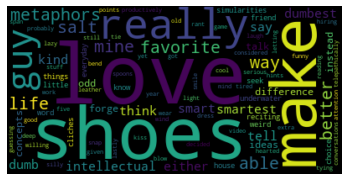

In [49]:
# Create and generate a word cloud image:
wordcloud = WordCloud().generate(essay_master)

# Display the generated image:
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

def filter_data(data, words):
   Returns true if all of the words in the list appear in the question.
  filter = lambda x: all(word.lower() in x.lower() for word in words)
   filter = lambda x: all(words.lower() in x.lower()) #cannot apply .lower() to a whole list
  
   Applies the lambda function to the question column 
 and returns the rows where the function returned True
  #return data.loc[data["question"].apply(filter)]

 Testing the filter function
#filtered = filter_data(jeop, ["King", "England"])
#print(filtered["question"])

def word_sort(data, words):
   Turns all the words in a string into a list
  filter = lambda x: all(word.lower() in x.lower() for word in words)

   filter = lambda x: all(words.lower() in x.lower()) #cannot apply .lower() to a whole list
  
   Applies the lambda function to the question column 
 and returns the rows where the function returned True
  return data.loc[data["essay0"].apply(filter)]
  return filter

 Testing the filter function
master = word_sort(okcupid, okcupid.essay0)
print(master)

In [44]:
import this

The Zen of Python, by Tim Peters

Beautiful is better than ugly.
Explicit is better than implicit.
Simple is better than complex.
Complex is better than complicated.
Flat is better than nested.
Sparse is better than dense.
Readability counts.
Special cases aren't special enough to break the rules.
Although practicality beats purity.
Errors should never pass silently.
Unless explicitly silenced.
In the face of ambiguity, refuse the temptation to guess.
There should be one-- and preferably only one --obvious way to do it.
Although that way may not be obvious at first unless you're Dutch.
Now is better than never.
Although never is often better than *right* now.
If the implementation is hard to explain, it's a bad idea.
If the implementation is easy to explain, it may be a good idea.
Namespaces are one honking great idea -- let's do more of those!
